# Overview of Segment Anything

In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

Load example image and resize it

In [3]:
image = cv2.imread('../data/32692_5335.tif')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (1000, 1000))


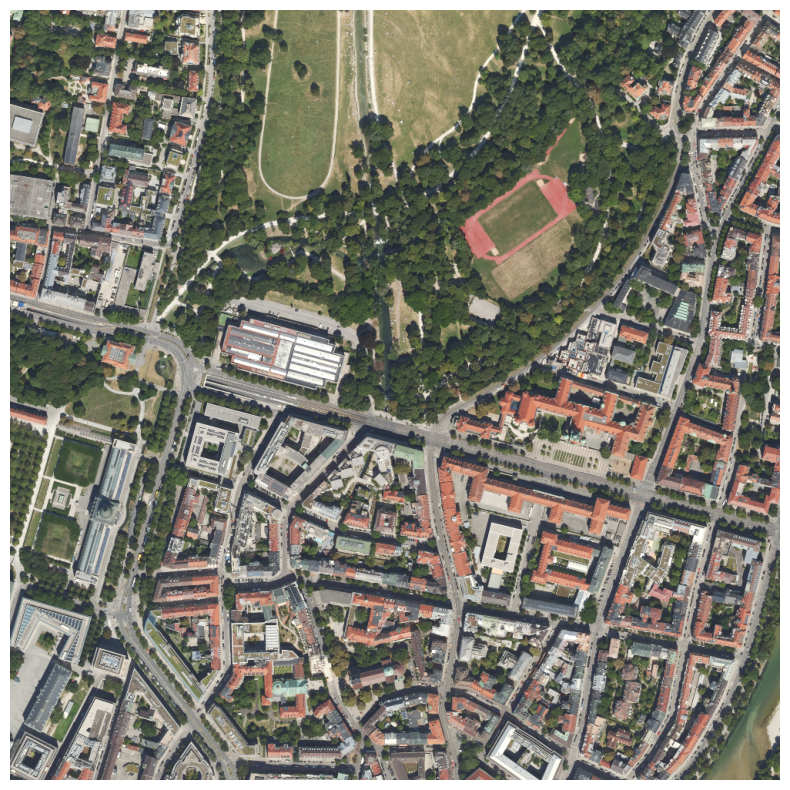

In [4]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.show()

## SAM Automated Mask Generator

In [5]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


# Depending on your GPU you can choose between vit_l and vit_h
# ..ViT-L having 308M, and ViT-H having 636M parameters
# You can also change the points per batch
# Strong GPU
# SAM_CHECKPOINT = "checkpoints/sam_vit_h_4b8939.pth"
# MODEL_TYPE = "vit_h"
# POINTS_PER_BATCH = 64
# Weak GPU
SAM_CHECKPOINT = "checkpoints/sam_vit_l_0b3195.pth"
MODEL_TYPE = "vit_l"
POINTS_PER_BATCH = 10
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

sam = sam_model_registry[MODEL_TYPE](checkpoint=SAM_CHECKPOINT)
sam.to(device=DEVICE)


mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_batch=POINTS_PER_BATCH,
)

In [6]:
# Helper function to show the masks
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

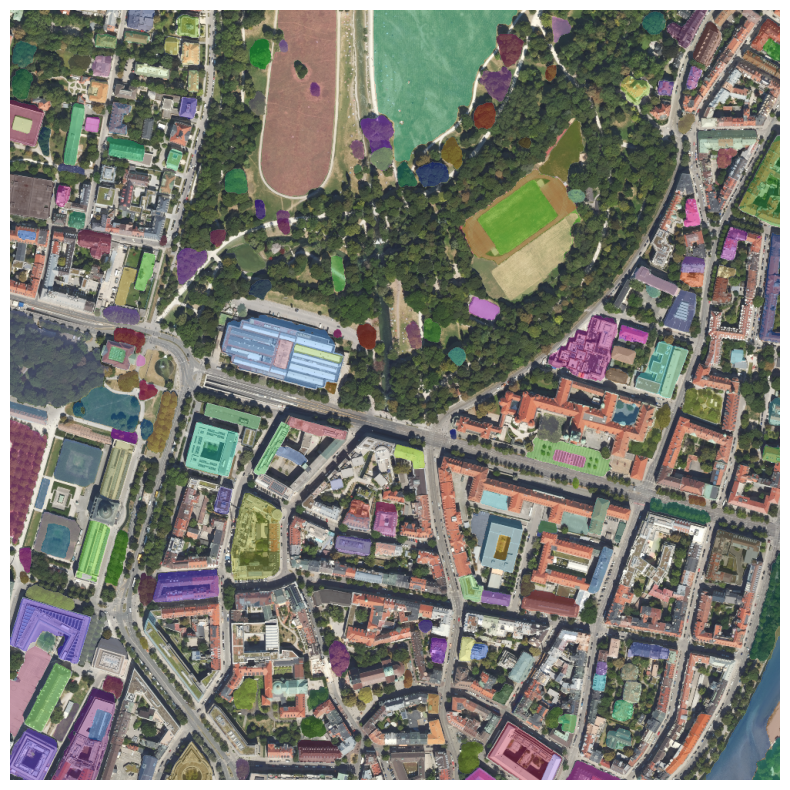

In [7]:
masks = mask_generator.generate(image)
plt.figure(figsize=(10,10))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

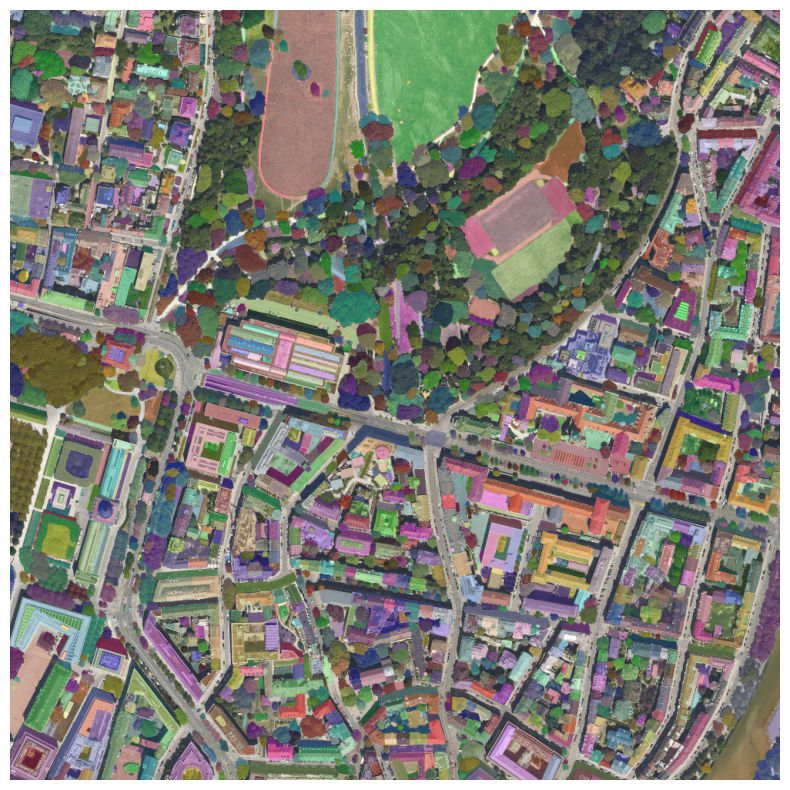

In [8]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=100,
    points_per_batch=POINTS_PER_BATCH,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=1,
    min_mask_region_area=1000,  # Requires open-cv to run post-processing
)

masks_2 = mask_generator_2.generate(image)
plt.figure(figsize=(10,10))
plt.imshow(image)
show_anns(masks_2)
plt.axis('off')
plt.show() 

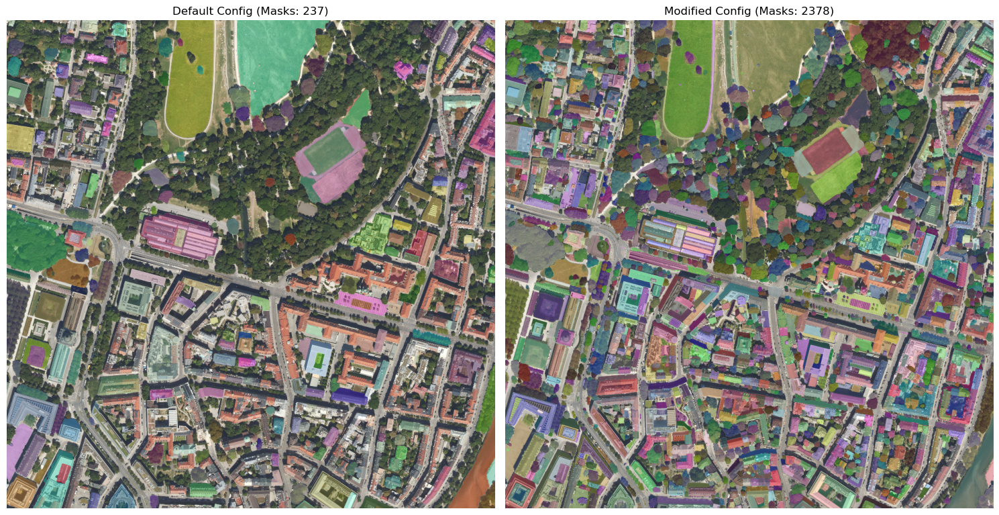

In [9]:
# create both masks compared in a subplot
plt.figure(figsize=(15,10))
plt.subplot(121)
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.title(f'Default Config (Masks: {len(masks)})')
plt.subplot(122)
plt.imshow(image)
show_anns(masks_2)
plt.axis('off')
plt.title(f'Modified Config (Masks: {len(masks_2)})')
plt.tight_layout()
plt.show()

- Reducing `pred_iou_thresh` and `stability_score_thresh` will increase the number of masks generated.
- Increasing `points_per_side` returns more masks, but increases runtime.



## Generate Mask with Bounding Box

In [9]:
from segment_anything import SamPredictor

# sam = sam_model_registry[MODEL_TYPE](checkpoint=SAM_CHECKPOINT)
# sam.to(device=DEVICE)

predictor = SamPredictor(sam)

In [10]:
# helper function to show the masks
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='.', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='.', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))  

In [11]:
predictor.set_image(image)

### Select a fixed point on the image

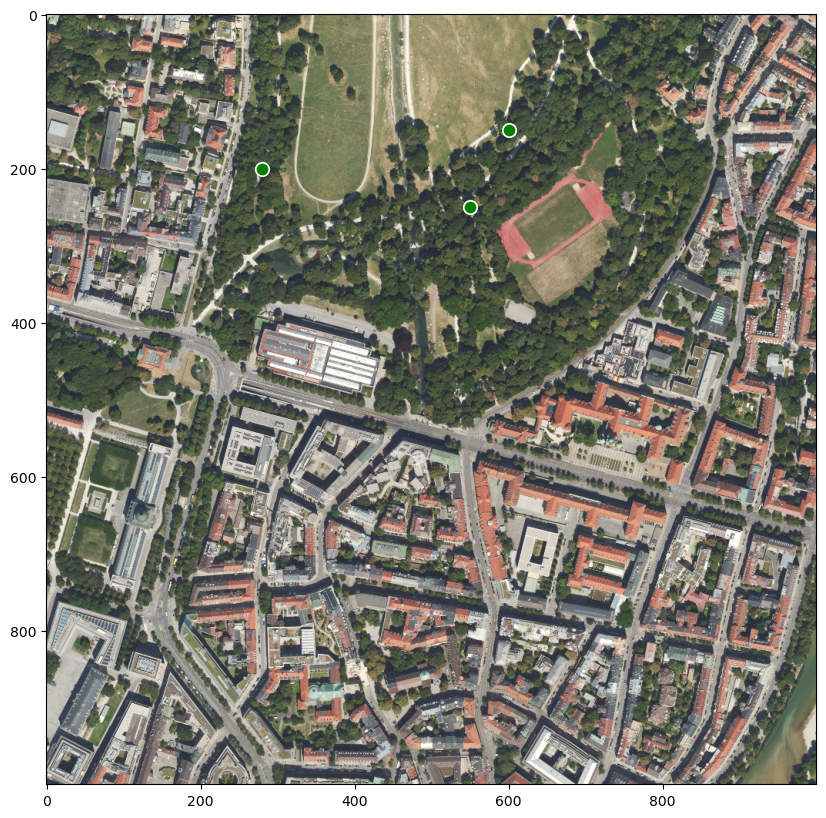

In [12]:
# set the input point and label

input_point = np.array([[550, 250], [600, 150], [280, 200]])
input_label = np.array([1, 1, 1])
# input_point = np.array([[550, 250], [600, 150], [280, 200], [50, 450], [150, 220]])
# input_label = np.array([1, 1, 1, 1, 0])


plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

In [13]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True, # returns 3 masks rated and each has a score
)

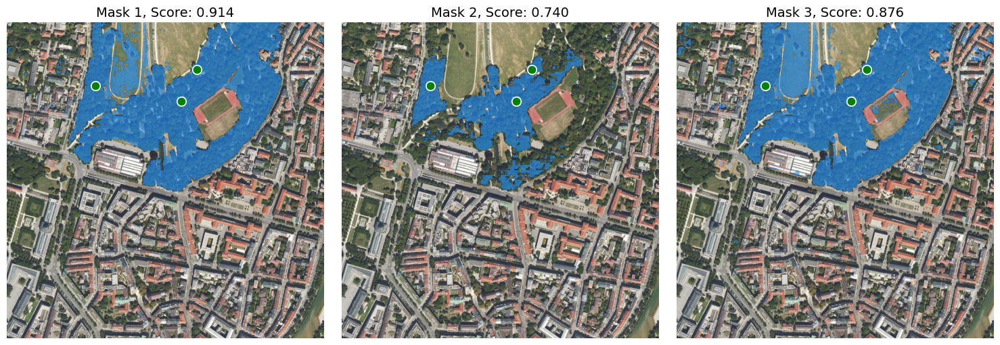

In [14]:
# Create a single row subplot with three columns
fig, axes = plt.subplots(1, len(masks), figsize=(15, 5))

# Iterate through each image and plot it in the corresponding subplot
for i, (mask, score) in enumerate(zip(masks, scores)):
    ax = axes[i]  # Select the current subplot
    ax.imshow(image)
    show_mask(mask, ax)
    show_points(input_point, input_label, ax)
    ax.set_title(f"Mask {i+1}, Score: {score:.3f}", fontsize=14)
    ax.axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

### Select a bounding box

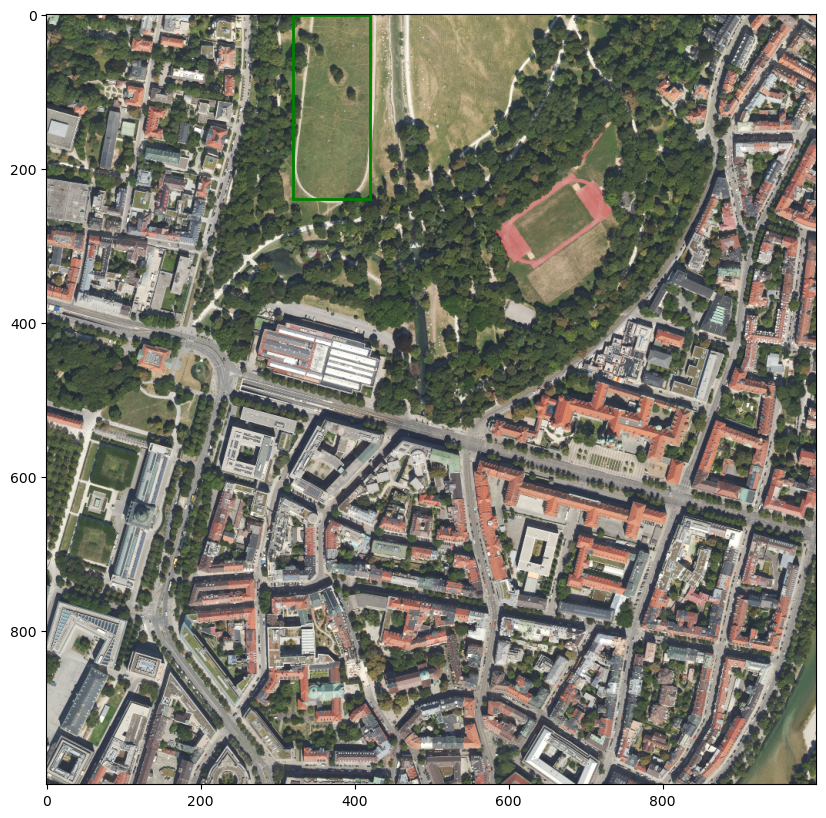

In [15]:
input_box = np.array([320, 240, 420, 0])

plt.figure(figsize=(10,10))
plt.imshow(image)
show_box(input_box, plt.gca())
plt.axis('on')
plt.show()  

In [16]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=True,
)

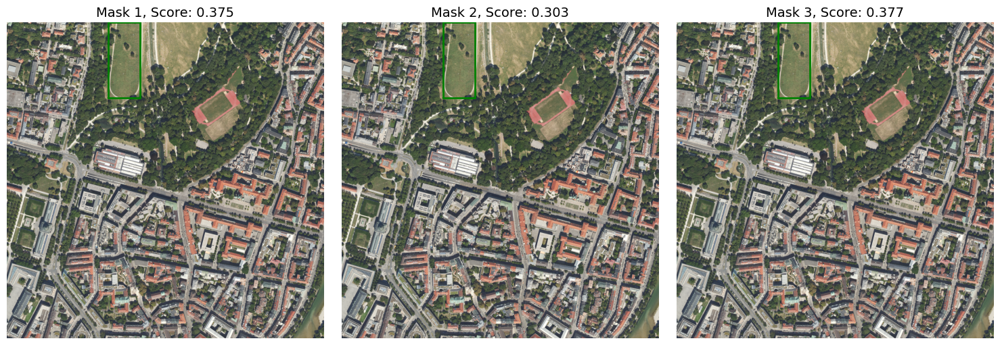

In [17]:
# Create a single row subplot with three columns
fig, axes = plt.subplots(1, len(masks), figsize=(15, 5))

# Iterate through each image and plot it in the corresponding subplot
for i, (mask, score) in enumerate(zip(masks, scores)):
    ax = axes[i]  # Select the current subplot
    ax.imshow(image)
    show_mask(mask, ax)
    show_box(input_box, ax)
    ax.set_title(f"Mask {i+1}, Score: {score:.3f}", fontsize=14)
    ax.axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()